## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imshow('img',img)
        cv2.waitKey(500)
        
        # Camera calibration, given object points, image points, and the shape of the grayscale image:
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
        undist = cv2.undistort(img, mtx, dist, None, mtx)

cv2.destroyAllWindows()

## And so on and so forth...

Should now have objpoints and imgpoints needed for camera calibration. Run the cell below to calibrate, calculate distortion coefficients, and test undistortion on an image

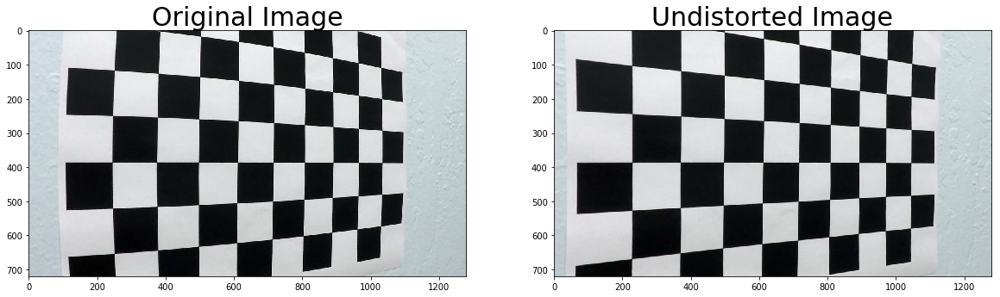

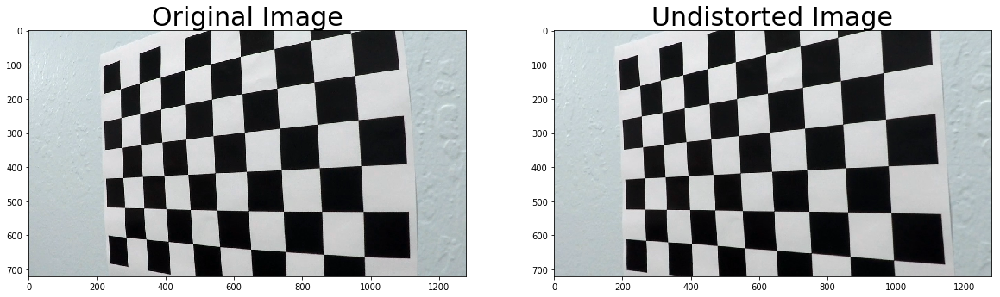

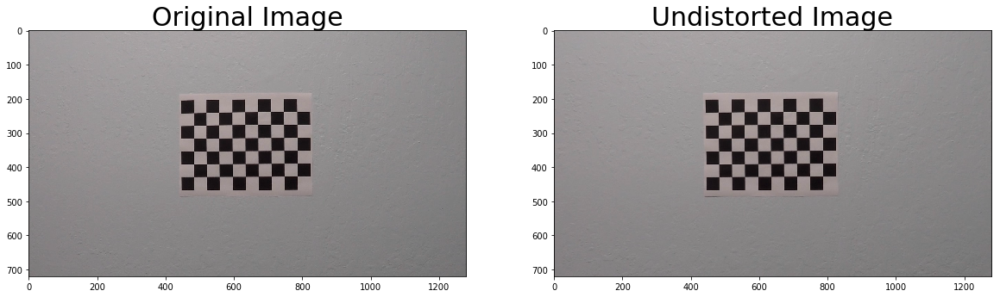

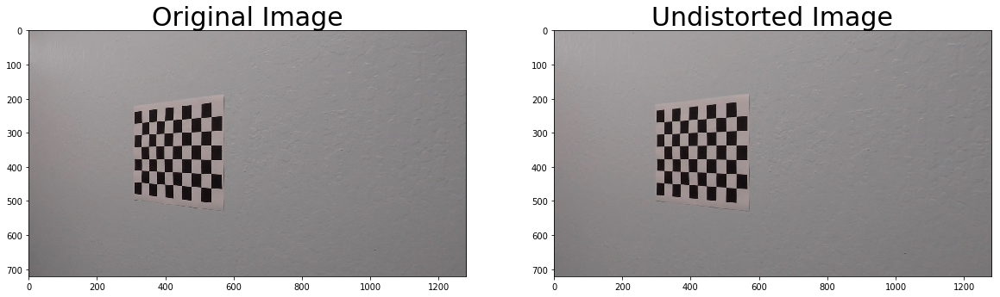

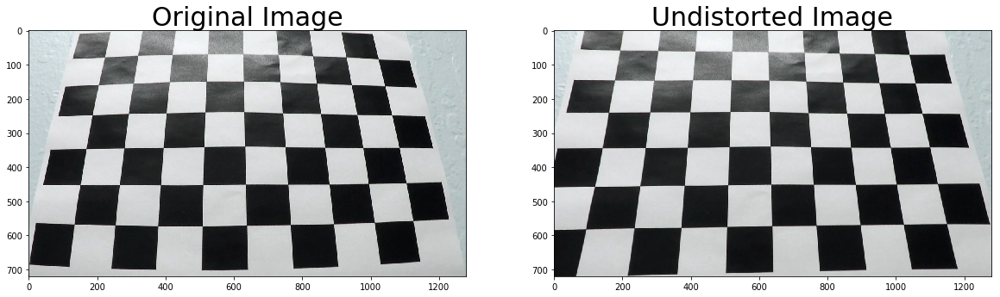

...

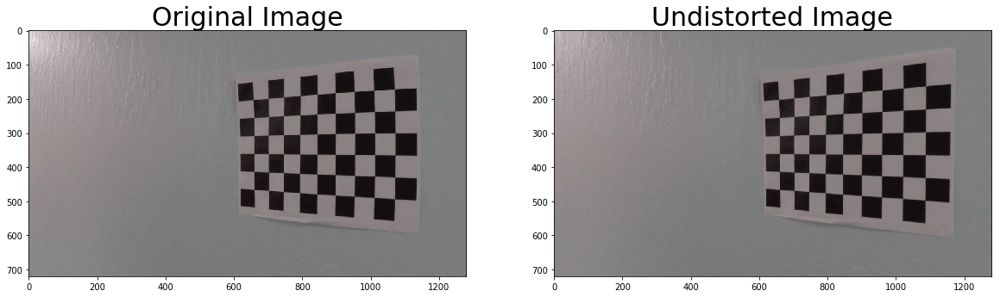

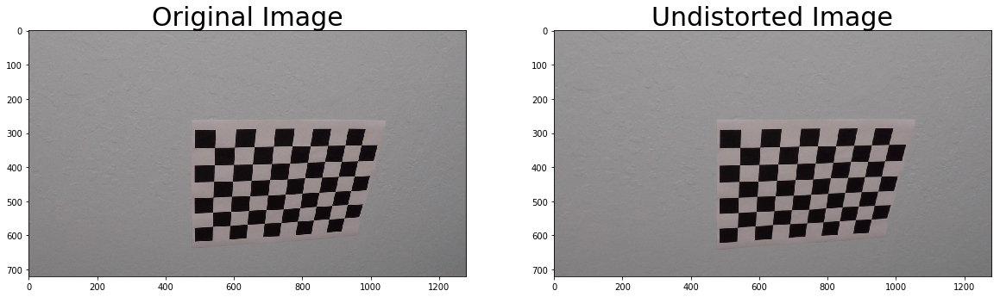

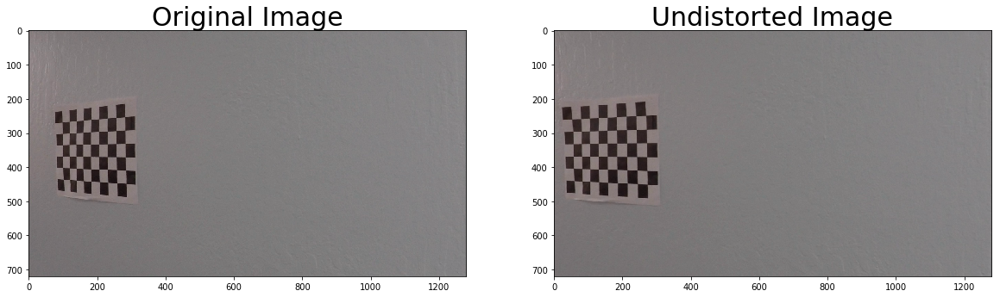

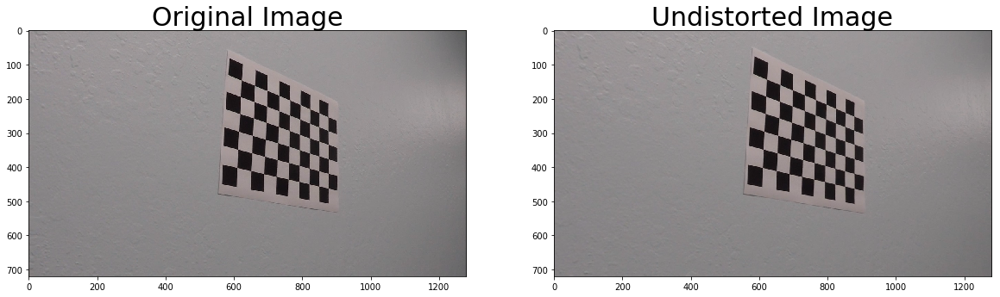

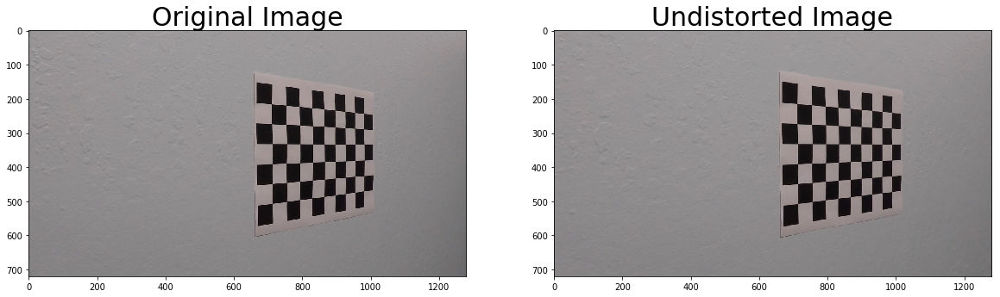

In [2]:
import pickle
%matplotlib inline

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Test undistortion on an image
# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    img_size = (img.shape[1], img.shape[0])

    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

    dst = cv2.undistort(img, mtx, dist, None, mtx)
    cv2.imwrite('camera_cal/test_undist_' + fname + '.jpg',dst)

    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist
    with open('camera_cal/wide_dist_pickle.pickle', 'wb') as handle:
        pickle.dump(dist_pickle, handle, protocol=pickle.HIGHEST_PROTOCOL)

    #dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=30)

Use color transforms, gradients, etc., to create a thresholded binary image

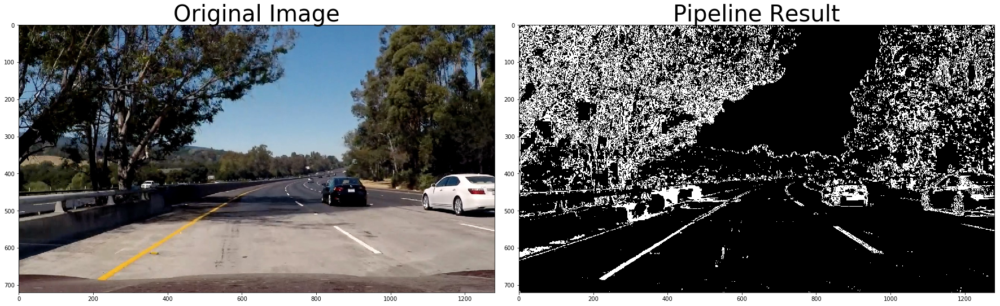

In [3]:
import matplotlib.image as mpimg
%matplotlib inline

image = mpimg.imread('test_images/test5.jpg')

# Edit this function to create your own pipeline.
def binary_filter(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    
    return combined_binary
    
result = binary_filter(image)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result,cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40, )
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Apply a perspective transform to rectify binary image ("birds-eye view").

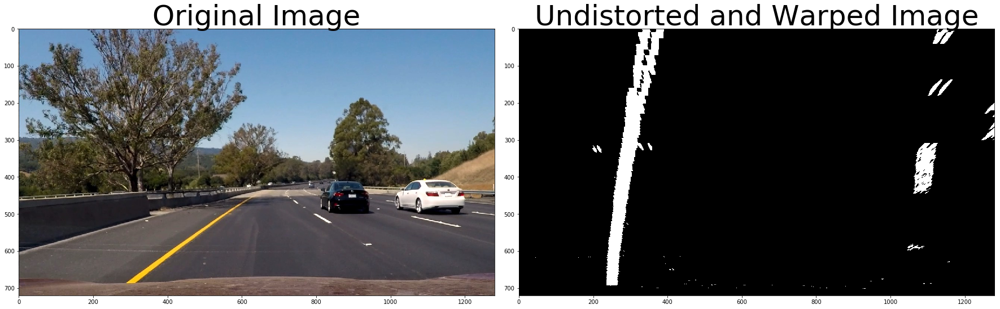

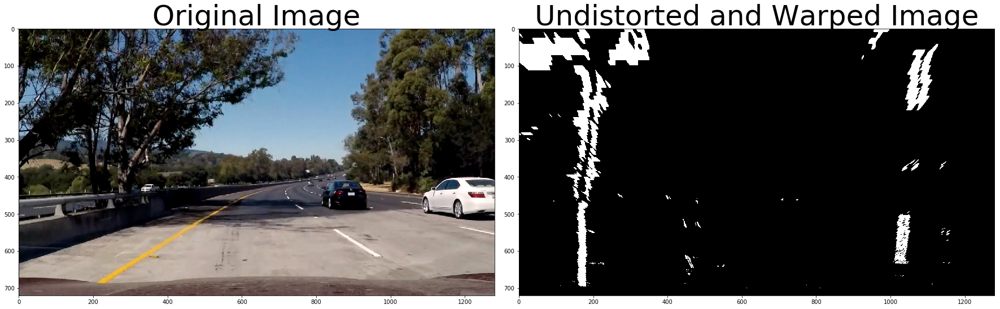

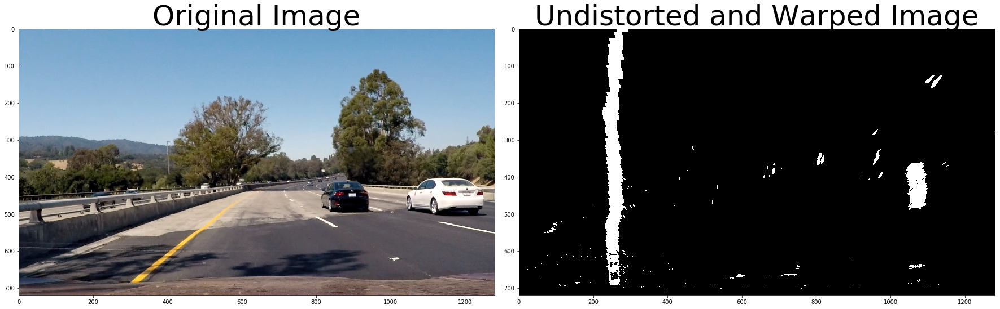

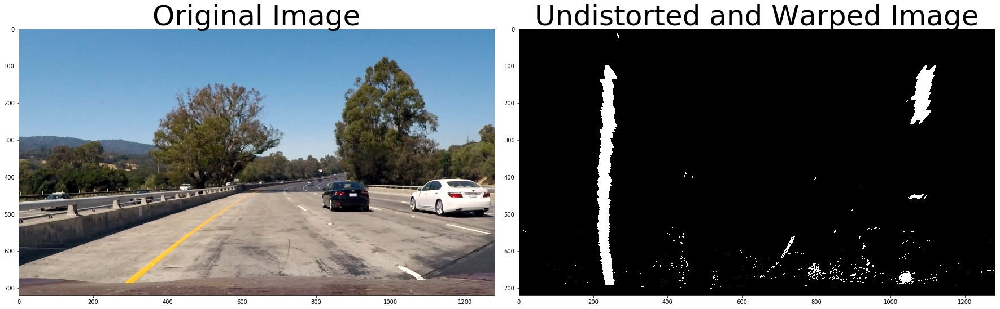

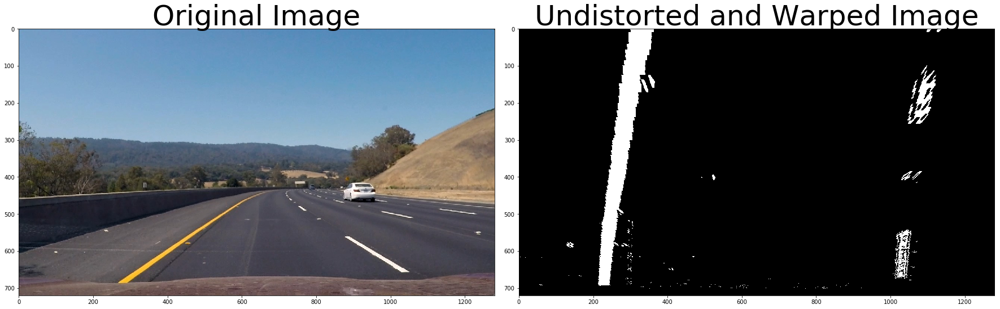

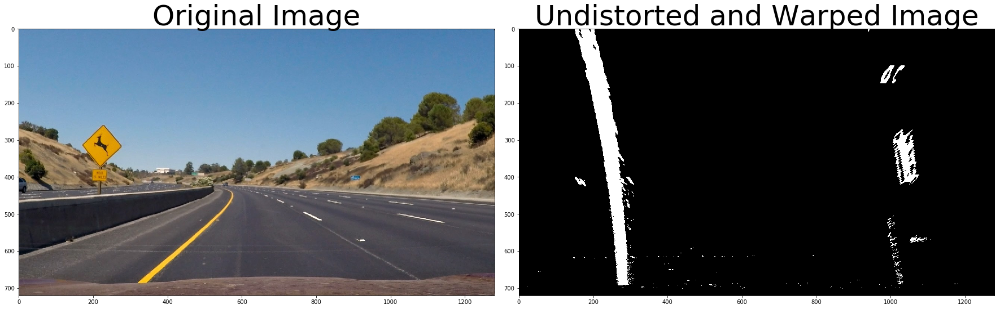

In [4]:
import pickle
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib qt
%matplotlib inline

# Make a list of calibration images
images = glob.glob('test_images/test*.jpg')

dist_pickle = pickle.load(open( "camera_cal/wide_dist_pickle.pickle", "rb"))
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

# Define a function that takes an image, number of x and y points, 
# camera matrix and distortion coefficients
def persepctive_transform(img, mtx, dist):
    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    # For source points I'm grabbing the outer four detected corners

    # For destination points, I'm arbitrarily choosing some points to be
    # a nice fit for displaying our warped result 
    # again, not exact, but close enough for our purposes
    # TODO:
    leftupperpoint  = [570,470]
    rightupperpoint = [720,470]
    leftlowerpoint  = [260,680]
    rightlowerpoint = [1050,680]
    
    src = np.float32([leftupperpoint, leftlowerpoint, rightupperpoint, rightlowerpoint])
    dst = np.float32([[200,0], [200,680], [1000,0], [1000,680]])
    
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    
    img_size = (undist.shape[1], undist.shape[0])
    
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)

    # Return the resulting image and matrix
    return warped, M

for fname in images:
    image = mpimg.imread(fname)
    binary_img = binary_filter(image)
    top_down, perspective_M = persepctive_transform(binary_img, mtx, dist)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(top_down,cmap='gray')
    ax2.set_title('Undistorted and Warped Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Detect lane pixels and fit to find the lane boundary.

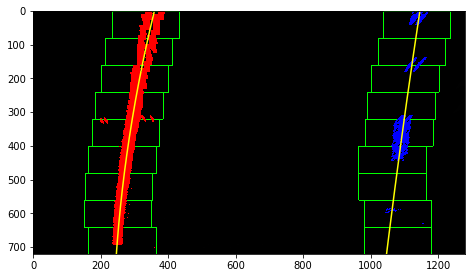

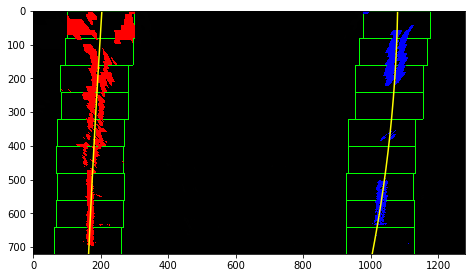

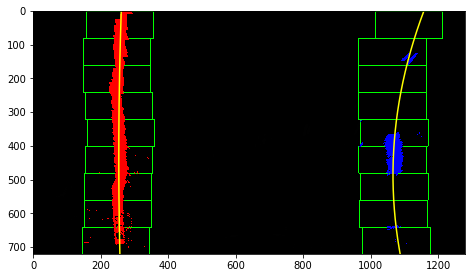

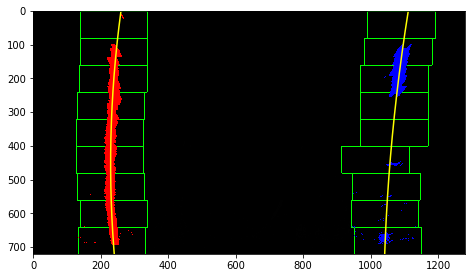

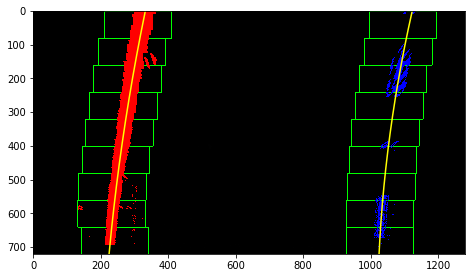

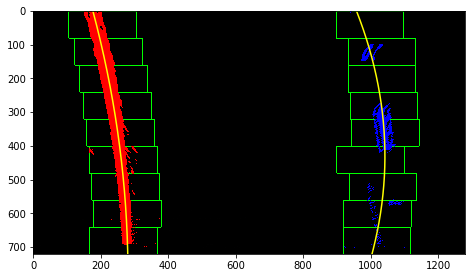

In [5]:
%matplotlib qt
%matplotlib inline

def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    
    return out_img

for fname in images:
    image = mpimg.imread(fname)
    binary_image = binary_filter(image)
    top_down, perspective_M = persepctive_transform(binary_image, mtx, dist)
    out_img = fit_polynomial(top_down)
    
    plt.imshow(out_img)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()


Determine the curvature of the lane and vehicle position with respect to center.
Warp the detected lane boundaries back onto the original image.
Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [190]:
def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    lane = {}
    lane["left_fitx"] = left_fitx
    lane["ploty"] = ploty
    lane["right_fitx"] = right_fitx

    return lane

def inv_persepctive_transform(img, mtx, dist):
    leftupperpoint  = [570,470]
    rightupperpoint = [720,470]
    leftlowerpoint  = [260,680]
    rightlowerpoint = [1050,680]
    
    dst = np.float32([leftupperpoint, leftlowerpoint, rightupperpoint, rightlowerpoint])
    src = np.float32([[200,0], [200,680], [1000,0], [1000,680]])
    
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    
    img_size = (img.shape[1], img.shape[0])
    
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)

    # Return the resulting image and matrix
    return warped, M

def og_img_plot_lanes(image, lane):
    image = np.dstack((image, image, image))*255

    top_down_og, perspective_M_og = persepctive_transform(image, mtx, dist)

    # draw lane 
    left_points = np.array(list(zip(lane["left_fitx"], lane["ploty"])), np.int32)
    right_points = np.array(list(zip(lane["right_fitx"], lane["ploty"])), np.int32)
    
    cv2.polylines(top_down_og, [left_points], False, [255, 0, 0], 15)
    cv2.polylines(top_down_og, [right_points], False, [255, 0, 0], 15)
    
    # Draw the lane onto the warped blank image
    left_line_window = np.array(np.transpose(np.vstack([lane["left_fitx"], lane["ploty"]])))
    right_line_window = np.array(np.flipud(np.transpose(np.vstack([lane["right_fitx"], lane["ploty"]]))))
    line_points = np.vstack((left_line_window, right_line_window))

    cv2.fillPoly(top_down_og, np.int_([line_points]), [0,255,0])
    
    inv_warped_img, M = inv_persepctive_transform(top_down_og, mtx, dist)
        
    return inv_warped_img

def weighted_img(img, initial_img, α=0.8, β=1., γ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, γ)

for fname in images:
    image = mpimg.imread(fname)
    
    binary_image = binary_filter(image)
    
    top_down_binary_warped, perspective_M_bin = persepctive_transform(binary_image, mtx, dist)
    
    lane = fit_polynomial(top_down_binary_warped)
    
    inv_warped_img = og_img_plot_lanes(binary_image, lane)
    
    result = weighted_img(inv_warped_img, image, 1.0, 0.3, 0)

    plt.imshow(result)
    plt.show()


NameError: name 'images' is not defined

Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [207]:
def binary_filter(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel_x = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Sobel y
    sobely = cv2.Sobel(l_channel, cv2.CV_64F, 0, 1) # Take the derivative in x
    abs_sobely = np.absolute(sobely) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel_y = np.uint8(255*abs_sobely/np.max(abs_sobely))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel_x)
    sxbinary[(scaled_sobel_x >= sx_thresh[0]) & (scaled_sobel_x <= sx_thresh[1])] = 1
    
#     # Threshold y gradient
#     sybinary = np.zeros_like(scaled_sobel_y)
#     sybinary[(scaled_sobel_y >= sy_thresh[0]) & (scaled_sobel_y <= sy_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    
    return combined_binary

# Define a function that takes an image, number of x and y points, 
# camera matrix and distortion coefficients
def persepctive_transform(img, mtx, dist):
    # source points on the image
    leftupperpoint  = [570,470]
    rightupperpoint = [720,470]
    leftlowerpoint  = [260,680]
    rightlowerpoint = [1050,680]
    
    # destination points to transform to
    src = np.float32([leftupperpoint, leftlowerpoint, rightupperpoint, rightlowerpoint])
    dst = np.float32([[200,0], [200,680], [1000,0], [1000,680]])
    
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    
    img_size = (img.shape[1], img.shape[0])
    
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)

    # Return the resulting image and matrix
    return warped, M

def inv_persepctive_transform(img, mtx, dist):
    leftupperpoint  = [570,470]
    rightupperpoint = [720,470]
    leftlowerpoint  = [260,680]
    rightlowerpoint = [1050,680]
    
    dst = np.float32([leftupperpoint, leftlowerpoint, rightupperpoint, rightlowerpoint])
    src = np.float32([[200,0], [200,680], [1000,0], [1000,680]])
    
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    
    img_size = (img.shape[1], img.shape[0])
    
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)

    # Return the resulting image and matrix
    return warped, M

def og_img_plot_lanes(image, left_lane, right_lane):
    image = np.dstack((image, image, image))*255

    top_down_og, perspective_M_og = persepctive_transform(image, mtx, dist)

    # draw lane 
    left_points = np.array(list(zip(left_lane.avgx, left_lane.avgy)), np.int32)
    right_points = np.array(list(zip(right_lane.avgx, right_lane.avgy)), np.int32)
    
    cv2.polylines(top_down_og, [left_points], False, [255, 0, 0], 15)
    cv2.polylines(top_down_og, [right_points], False, [255, 0, 0], 15)
    
    # Draw the lane onto the warped blank image
    left_line_window = np.array(np.transpose(np.vstack([left_lane.avgx, left_lane.avgy])))
    right_line_window = np.array(np.flipud(np.transpose(np.vstack([right_lane.avgx, right_lane.avgy]))))

    line_points = np.vstack((left_line_window, right_line_window))

    cv2.fillPoly(top_down_og, np.int_([line_points]), [0,255,0])
    
    inv_warped_img, M = inv_persepctive_transform(top_down_og, mtx, dist)
    
    return inv_warped_img
    

def fit_lane_lines(binary_warped):
    global left_lane
    global right_lane
    
    # need to finish sanity check function someday
    if left_lane.detected == True and right_lane.detected == True:
        # search for lanes around previously detected lanes
        left_lane_new, right_lane_new = search_around_poly(binary_warped, left_lane, right_lane)
        
        sanity_flag = sanity_check(left_lane, left_lane_new, right_lane, right_lane_new)

        # If the new lane values are a good fit, update the existing lanes 
        # if the new found lane lines are not a good fit, use the averaged fitted
        if sanity_flag == False:
            reset_flag = (left_lane.check_reset() | right_lane.check_reset())

            if reset_flag:
                leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
                left_lane_new, right_lane_new = fit_polynomial(out_img, leftx, lefty, rightx, righty)
                
                left_lane.update_lane_values(left_lane_new)
                right_lane.update_lane_values(right_lane_new)
        else:
                left_lane.update_lane_values(left_lane_new)
                right_lane.update_lane_values(right_lane_new)
            
    else:
        leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
        left_lane_new, right_lane_new = fit_polynomial(out_img, leftx, lefty, rightx, righty)
        
        left_lane.update_lane_values(left_lane_new)
        right_lane.update_lane_values(right_lane_new)
        
        left_lane.detected = True
        right_lane.detected = True
        
    return left_lane, right_lane

# check for distance between the lanes
# maybe fix someday. CUrrently pixel calculation doesn't work
def lane_dist_check(left_lane, left_lane_new, right_lane, right_lane_new):
    check_flag = True
    
    tol_1 = 750
    tol_2 = 850
    
    percent_change = np.absolute(left_lane_new['lane_dist'] - left_lane.avg_lane_dist / np.absolute(left_lane.avg_lane_dist))
    
    if not (((percent_change < tol_1) & (percent_change > tol_2)).all()):
        check_flag = False
    
    return check_flag

# Sanity checking percentage difference. If new fit values are over 50%, it is not correct
def sanity_check(left_lane, left_lane_new, right_lane, right_lane_new):
    sane_flag = True
    acceptable_pct_change = 0.5
    
    pct_coeff_change_l = np.absolute(left_lane_new['current_fit'] - left_lane.avg_fit / \
                                     np.absolute(left_lane.avg_fit))
    pct_coeff_change_r = np.absolute(right_lane_new['current_fit'] - right_lane.avg_fit / \
                                     np.absolute(right_lane.avg_fit))
    
    mask = ((pct_coeff_change_l > acceptable_pct_change) & \
            (pct_coeff_change_r > acceptable_pct_change))
    
    if not mask.all(): 
        sane_flag = False
    
    return sane_flag

def fit_polynomial(binary_warped, leftx, lefty, rightx, righty):
    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
    
    ## Curvature Calculation ##
    left_curverad, \
    right_curverad, \
    center_dist, \
    center_pos = measure_curvature_pixels(binary_warped, ploty, leftx, lefty, rightx, righty, left_fit, right_fit)

    left_lane_new = {}
    right_lane_new = {}
    
    # Plots the left and right polynomials on the lane lines
    left_lane_new['current_fit'] = left_fit
    left_lane_new['allx'] = left_fitx
    left_lane_new['ally'] = ploty
    
    right_lane_new['current_fit'] = right_fit
    right_lane_new['allx'] = right_fitx
    right_lane_new['ally'] = ploty
    
    left_lane_new['radius_of_curvature'] = left_curverad
    right_lane_new['radius_of_curvature'] = right_curverad
    left_lane_new['center_dist'] = center_dist
    right_lane_new['center_dist'] = center_dist
    left_lane_new['lane_center_pos'] = center_pos
    right_lane_new['lane_center_pos'] = center_pos

    return left_lane_new, right_lane_new

def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

def measure_curvature_pixels(binary_warped_img, ploty, leftx, lefty, rightx, righty, left_fit, right_fit):
    '''
    Calculates the curvature of polynomial functions in pixels.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 15/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    ##### Calculation of R_curve (radius of curvature) #####
    left_fit_d  = 2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1]
    left_fit_dd = 2*left_fit_cr[0]
    right_fit_d  = 2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1]
    right_fit_dd = 2*right_fit_cr[0]
    
    left_curverad = (1 + left_fit_d**2)**1.5 / np.absolute(left_fit_dd)
    right_curverad = (1 + right_fit_d**2)**1.5 / np.absolute(right_fit_dd)
    
    ## Calculation of lane center ## 
    img_height = binary_warped_img.shape[0]
    img_width = binary_warped_img.shape[1]
    car_center_pos = img_width / 2
    left_fit_x = left_fit[0]*img_height**2 + left_fit[1]*img_height + left_fit[2]
    right_fit_x = right_fit[0]*img_height**2 + right_fit[1]*img_height + right_fit[2]
    
    lane_center_position = (left_fit_x + right_fit_x) /2
    center_dist = (car_center_pos - lane_center_position) * xm_per_pix
    lane_dist = np.absolute(right_fit_x - left_fit_x)
    
    return left_curverad, right_curverad, center_dist, lane_center_position


def display_data(img, left_lane, right_lane):
    curve_rad = (left_lane.radius_of_curvature + right_lane.radius_of_curvature ) / 2
    center_dist = left_lane.center_dist
    
    car_dir = ''
    
    if center_dist > 0:
        car_dir = 'right'
    elif center_dist < 0:
        car_dir = 'left'
    
    font = cv2.FONT_HERSHEY_DUPLEX
    radius_text = 'Curve radius: ' + '{:04.2f}'.format(curve_rad) + 'm'
    center_text = '{:04.3f}'.format(abs(center_dist)) + 'm ' + car_dir + ' of center'
    
    cv2.putText(img, radius_text, (40,70), font, 1.5, (200,200,150), 2, cv2.LINE_AA)
    cv2.putText(img, center_text, (40,120), font, 1.5, (200,200,150), 2, cv2.LINE_AA)
    return img

def search_around_poly(binary_warped, left_lane, right_lane):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    left_fit = left_lane.avg_fit[0]
    right_fit = right_lane.avg_fit[0]

    ### Set the area of search based on activated x-values ###
    left_fit_line = left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2]
    right_fit_line = right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2]
    
    xleft_low = left_fit_line - margin
    xleft_high = left_fit_line + margin
    xright_low = right_fit_line - margin
    xright_high = right_fit_line + margin
    
    left_lane_inds = ((nonzerox > xleft_low) & (nonzerox < xleft_high))
    right_lane_inds = ((nonzerox > xright_low) & (nonzerox < xright_high))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_lane_new, right_lane_new = fit_polynomial(binary_warped, leftx, lefty, rightx, righty)
    
    return left_lane_new, right_lane_new

def weighted_img(img, initial_img, α=0.8, β=1., γ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, γ)

# Define a class to receive the characteristics of each line detection
class Lane():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        self.recent_yfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.avg_fit = None  
        #polynomial coefficients for the most recent fits
        self.prev_fits = []
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = []  
        self.avgx = []  
        #y values for detected line pixels
        self.ally = [] 
        self.avgy = []  
        #value for the lane center
        self.center_dist = None
        # count of consecutive bad frames, rest if it goes over limit 
        self.bad_frame_count = 0
        # center position of the lane, used for sanity checking
        self.lane_center_pos = 0
        self.recent_lane_center = []
        self.avg_center_pos = 0
        # distance between lanes, used for sanity checking
        self.lane_dist = 0
        self.recent_lane_dist = []
        self.avg_lane_dist = 0
        
    def reset_lane(self):
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        self.recent_yfitted = [] 
        self.avg_fit = None  
        self.prev_fits = []
        self.current_fit = [np.array([False])]
        self.radius_of_curvature = None 
        self.line_base_pos = None 
        self.diffs = np.array([0,0,0], dtype='float') 
        self.allx = []  
        self.avgx = []  
        self.ally = [] 
        self.avgy = []  
        self.center_dist = None
        self.bad_frame_count = 0
        self.lane_center_pos = 0
        self.recent_lane_center = []
        self.avg_center_pos = 0
        
        return
    
    def check_reset(self):
        reset_flag = False
        num_bad_frames = 5
        
        self.bad_frame_count += 1
        
        if self.bad_frame_count >= num_bad_frames:
            reset_flag = True
            self.bad_frame_count = 0
        
        return reset_flag
        
    def update_lane_values(self, lane_new):
        self.current_fit = lane_new['current_fit']
        self.allx = lane_new['allx']
        self.ally = lane_new['ally']
        self.radius_of_curvature = lane_new['radius_of_curvature']
        self.center_dist = lane_new['center_dist']
        self.lane_center_pos = lane_new['lane_center_pos']
        self.calculate_avg_lane()
    
        return
    
    def calculate_avg_lane(self):
        avg_num = 10
        
        if len(self.prev_fits) < avg_num:
            self.prev_fits.append([self.current_fit])
            self.recent_xfitted.append(self.allx)
            self.recent_yfitted.append(self.ally)
            self.recent_lane_center.append(self.lane_center_pos)
            
            self.avg_fit = np.array(np.sum(self.prev_fits, axis=0) / len(self.prev_fits))
            
            if len(self.recent_xfitted) > 1:
                self.avgx = np.sum(self.recent_xfitted,axis=0) / len(self.prev_fits)
                self.avgy = np.sum(self.recent_yfitted,axis=0) / len(self.prev_fits)
                self.avg_center_pos = np.sum(self.recent_lane_center,axis=0) / len(self.prev_fits)
            elif len(self.recent_xfitted) == 1:
                self.avgx = self.allx
                self.avgy = self.ally
                self.avg_center_pos = self.lane_center_pos
                    
        elif len(self.prev_fits) == avg_num:
            self.prev_fits.pop(0)
            self.recent_xfitted.pop(0)
            self.recent_yfitted.pop(0)
            self.recent_lane_center.pop(0)
            
            self.prev_fits.append([self.current_fit])
            self.recent_xfitted.append(self.allx)
            self.recent_yfitted.append(self.ally)
            self.recent_lane_center.append(self.lane_center_pos)
            
            self.avg_fit = np.mean(self.prev_fits,axis=0)
            self.avgx = np.mean(self.recent_xfitted,axis=0)
            self.avgy = np.mean(self.recent_yfitted,axis=0)
            self.avg_center_pos = np.mean(self.recent_lane_center,axis=0)
        
        return
        

In [208]:
import pickle
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip
%matplotlib qt
%matplotlib inline

dist_pickle = pickle.load(open( "camera_cal/wide_dist_pickle.pickle", "rb"))
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

def process_image(image):
    
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # Should return the final output (image where lines are drawn on lanes)
    
    # Use the OpenCV undistort() function to remove distortion
    undistorted = cv2.undistort(image, mtx, dist, None, mtx)
    
    # Apply thresholding to the image
    binary_image = binary_filter(undistorted)
    
    # Perform perspective transform on the image to obtain bird's eye view
    top_down_binary_warped, perspective_M_bin = persepctive_transform(binary_image, mtx, dist)
    
    # Fit the lane lines from the bird's eye view
    left_lane, right_lane = fit_lane_lines(top_down_binary_warped)
    
    # Plot lane lines onto the image
    inv_warped_img = og_img_plot_lanes(binary_image, left_lane, right_lane)
    
    # Display data onto the image
    inv_warped_img = display_data(inv_warped_img, left_lane, right_lane)
    
    result = weighted_img(inv_warped_img, image, 1.0, 0.3, 0)

    return result

In [211]:
left_lane = Lane()
right_lane = Lane()

output = 'project_video_with_lanes.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
# clip1 = VideoFileClip("project_video.mp4").subclip(10,50)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(lambda image: process_image(image)) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video project_video_with_lanes.mp4
[MoviePy] Writing video project_video_with_lanes.mp4













  0%|          | 0/1261 [00:00<?, ?it/s]










  0%|          | 1/1261 [00:00<02:06,  9.97it/s]










  0%|          | 2/1261 [00:00<02:06,  9.97it/s]










  0%|          | 4/1261 [00:00<02:03, 10.20it/s]










  0%|          | 5/1261 [00:00<02:10,  9.63it/s]










  0%|          | 6/1261 [00:00<02:10,  9.61it/s]










  1%|          | 8/1261 [00:00<02:01, 10.30it/s]










  1%|          | 10/1261 [00:00<01:57, 10.62it/s]










  1%|          | 12/1261 [00:01<01:55, 10.82it/s]










  1%|          | 14/1261 [00:01<01:51, 11.20it/s]










  1%|▏         | 16/1261 [00:01<01:51, 11.16it/s]










  1%|▏         | 18/1261 [00:01<01:50, 11.30it/s]










  2%|▏         | 20/1261 [00:01<01:51, 11.16it/s]










  2%|▏         | 22/1261 [00:01<01:50, 11.21it/s]










  2%|▏         | 24/1261 [00:02<01:53, 10.88it/s]










  2%|▏         | 26/1261 [00:02<01:57, 10.49it/s]










  2%|▏         | 28/1261 [00:02<02:04,  9.88

 13%|█▎        | 163/1261 [00:14<01:32, 11.91it/s]










 13%|█▎        | 165/1261 [00:14<01:31, 12.00it/s]










 13%|█▎        | 167/1261 [00:15<01:30, 12.03it/s]










 13%|█▎        | 169/1261 [00:15<01:30, 12.08it/s]










 14%|█▎        | 171/1261 [00:15<01:29, 12.20it/s]










 14%|█▎        | 173/1261 [00:15<01:29, 12.21it/s]










 14%|█▍        | 175/1261 [00:15<01:28, 12.23it/s]










 14%|█▍        | 177/1261 [00:15<01:29, 12.10it/s]










 14%|█▍        | 179/1261 [00:16<01:30, 11.89it/s]










 14%|█▍        | 181/1261 [00:16<01:30, 11.94it/s]










 15%|█▍        | 183/1261 [00:16<01:30, 11.94it/s]










 15%|█▍        | 185/1261 [00:16<01:30, 11.93it/s]










 15%|█▍        | 187/1261 [00:16<01:29, 11.97it/s]










 15%|█▍        | 189/1261 [00:16<01:29, 11.96it/s]










 15%|█▌        | 191/1261 [00:17<01:30, 11.89it/s]










 15%|█▌        | 193/1261 [00:17<01:31, 11.72it/s]










 15%|█▌        | 195/126

 27%|██▋       | 337/1261 [00:29<01:18, 11.77it/s]










 27%|██▋       | 339/1261 [00:29<01:18, 11.74it/s]










 27%|██▋       | 341/1261 [00:29<01:17, 11.85it/s]










 27%|██▋       | 343/1261 [00:29<01:17, 11.84it/s]










 27%|██▋       | 345/1261 [00:29<01:17, 11.87it/s]










 28%|██▊       | 347/1261 [00:30<01:17, 11.72it/s]










 28%|██▊       | 349/1261 [00:30<01:17, 11.71it/s]










 28%|██▊       | 351/1261 [00:30<01:17, 11.73it/s]










 28%|██▊       | 353/1261 [00:30<01:16, 11.84it/s]










 28%|██▊       | 355/1261 [00:30<01:16, 11.84it/s]










 28%|██▊       | 357/1261 [00:30<01:15, 11.92it/s]










 28%|██▊       | 359/1261 [00:31<01:16, 11.85it/s]










 29%|██▊       | 361/1261 [00:31<01:15, 11.85it/s]










 29%|██▉       | 363/1261 [00:31<01:16, 11.78it/s]










 29%|██▉       | 365/1261 [00:31<01:15, 11.89it/s]










 29%|██▉       | 367/1261 [00:31<01:15, 11.83it/s]










 29%|██▉       | 369/126

 41%|████      | 511/1261 [00:44<01:04, 11.63it/s]










 41%|████      | 513/1261 [00:44<01:04, 11.62it/s]










 41%|████      | 515/1261 [00:44<01:04, 11.64it/s]










 41%|████      | 517/1261 [00:44<01:04, 11.60it/s]










 41%|████      | 519/1261 [00:44<01:03, 11.65it/s]










 41%|████▏     | 521/1261 [00:44<01:03, 11.68it/s]










 41%|████▏     | 523/1261 [00:45<01:03, 11.69it/s]










 42%|████▏     | 525/1261 [00:45<01:02, 11.75it/s]










 42%|████▏     | 527/1261 [00:45<01:02, 11.70it/s]










 42%|████▏     | 529/1261 [00:45<01:02, 11.66it/s]










 42%|████▏     | 531/1261 [00:45<01:01, 11.78it/s]










 42%|████▏     | 533/1261 [00:46<01:01, 11.81it/s]










 42%|████▏     | 535/1261 [00:46<01:01, 11.86it/s]










 43%|████▎     | 537/1261 [00:46<01:01, 11.77it/s]










 43%|████▎     | 539/1261 [00:46<01:01, 11.73it/s]










 43%|████▎     | 541/1261 [00:46<01:01, 11.76it/s]










 43%|████▎     | 543/126

 54%|█████▍    | 685/1261 [00:58<00:50, 11.38it/s]










 54%|█████▍    | 687/1261 [00:58<00:50, 11.42it/s]










 55%|█████▍    | 689/1261 [00:58<00:49, 11.61it/s]










 55%|█████▍    | 691/1261 [00:59<00:48, 11.66it/s]










 55%|█████▍    | 693/1261 [00:59<00:48, 11.78it/s]










 55%|█████▌    | 695/1261 [00:59<00:48, 11.59it/s]










 55%|█████▌    | 697/1261 [00:59<00:48, 11.61it/s]










 55%|█████▌    | 699/1261 [00:59<00:48, 11.58it/s]










 56%|█████▌    | 701/1261 [00:59<00:47, 11.73it/s]










 56%|█████▌    | 703/1261 [01:00<00:47, 11.68it/s]










 56%|█████▌    | 705/1261 [01:00<00:47, 11.81it/s]










 56%|█████▌    | 707/1261 [01:00<00:46, 11.80it/s]










 56%|█████▌    | 709/1261 [01:00<00:46, 11.83it/s]










 56%|█████▋    | 711/1261 [01:00<00:46, 11.74it/s]










 57%|█████▋    | 713/1261 [01:00<00:46, 11.85it/s]










 57%|█████▋    | 715/1261 [01:01<00:46, 11.71it/s]










 57%|█████▋    | 717/126

 68%|██████▊   | 859/1261 [01:13<00:36, 11.14it/s]










 68%|██████▊   | 861/1261 [01:13<00:35, 11.31it/s]










 68%|██████▊   | 863/1261 [01:13<00:35, 11.37it/s]










 69%|██████▊   | 865/1261 [01:14<00:34, 11.41it/s]










 69%|██████▉   | 867/1261 [01:14<00:34, 11.36it/s]










 69%|██████▉   | 869/1261 [01:14<00:34, 11.46it/s]










 69%|██████▉   | 871/1261 [01:14<00:34, 11.34it/s]










 69%|██████▉   | 873/1261 [01:14<00:33, 11.45it/s]










 69%|██████▉   | 875/1261 [01:15<00:33, 11.51it/s]










 70%|██████▉   | 877/1261 [01:15<00:33, 11.42it/s]










 70%|██████▉   | 879/1261 [01:15<00:33, 11.33it/s]










 70%|██████▉   | 881/1261 [01:15<00:33, 11.39it/s]










 70%|███████   | 883/1261 [01:15<00:33, 11.37it/s]










 70%|███████   | 885/1261 [01:15<00:32, 11.46it/s]










 70%|███████   | 887/1261 [01:16<00:33, 11.30it/s]










 70%|███████   | 889/1261 [01:16<00:32, 11.39it/s]










 71%|███████   | 891/126

 82%|████████▏ | 1033/1261 [01:28<00:20, 11.33it/s]










 82%|████████▏ | 1035/1261 [01:29<00:19, 11.31it/s]










 82%|████████▏ | 1037/1261 [01:29<00:19, 11.38it/s]










 82%|████████▏ | 1039/1261 [01:29<00:19, 11.14it/s]










 83%|████████▎ | 1041/1261 [01:29<00:20, 10.55it/s]










 83%|████████▎ | 1043/1261 [01:29<00:20, 10.51it/s]










 83%|████████▎ | 1045/1261 [01:30<00:21, 10.04it/s]










 83%|████████▎ | 1047/1261 [01:30<00:20, 10.25it/s]










 83%|████████▎ | 1049/1261 [01:30<00:20, 10.40it/s]










 83%|████████▎ | 1051/1261 [01:30<00:19, 10.67it/s]










 84%|████████▎ | 1053/1261 [01:30<00:19, 10.81it/s]










 84%|████████▎ | 1055/1261 [01:30<00:18, 11.00it/s]










 84%|████████▍ | 1057/1261 [01:31<00:18, 10.91it/s]










 84%|████████▍ | 1059/1261 [01:31<00:18, 11.13it/s]










 84%|████████▍ | 1061/1261 [01:31<00:18, 11.11it/s]










 84%|████████▍ | 1063/1261 [01:31<00:17, 11.10it/s]










 84%|███

 96%|█████████▌| 1205/1261 [01:44<00:04, 11.42it/s]










 96%|█████████▌| 1207/1261 [01:44<00:04, 11.43it/s]










 96%|█████████▌| 1209/1261 [01:44<00:04, 11.62it/s]










 96%|█████████▌| 1211/1261 [01:44<00:04, 11.39it/s]










 96%|█████████▌| 1213/1261 [01:44<00:04, 11.48it/s]










 96%|█████████▋| 1215/1261 [01:45<00:04, 11.34it/s]










 97%|█████████▋| 1217/1261 [01:45<00:03, 11.38it/s]










 97%|█████████▋| 1219/1261 [01:45<00:03, 11.27it/s]










 97%|█████████▋| 1221/1261 [01:45<00:03, 11.33it/s]










 97%|█████████▋| 1223/1261 [01:45<00:03, 11.30it/s]










 97%|█████████▋| 1225/1261 [01:45<00:03, 11.36it/s]










 97%|█████████▋| 1227/1261 [01:46<00:03, 11.29it/s]










 97%|█████████▋| 1229/1261 [01:46<00:02, 11.40it/s]










 98%|█████████▊| 1231/1261 [01:46<00:02, 11.35it/s]










 98%|█████████▊| 1233/1261 [01:46<00:02, 11.43it/s]










 98%|█████████▊| 1235/1261 [01:46<00:02, 11.36it/s]










 98%|███

[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_with_lanes.mp4 

CPU times: user 11min, sys: 36.3 s, total: 11min 36s
Wall time: 1min 49s


In [212]:
from IPython.display import HTML

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

In [213]:
left_lane = Lane()
right_lane = Lane()

challenge_output = 'challenge_video_with_result.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
# clip1 = VideoFileClip("challenge_video.mp4").subclip(0,5)
clip1 = VideoFileClip("challenge_video.mp4")
white_clip = clip1.fl_image(lambda image: process_image(image)) #NOTE: this function expects color images!!
%time white_clip.write_videofile(challenge_output, audio=False)

[MoviePy] >>>> Building video challenge_video_with_result.mp4
[MoviePy] Writing video challenge_video_with_result.mp4













  0%|          | 0/485 [00:00<?, ?it/s]










  0%|          | 2/485 [00:00<00:42, 11.32it/s]










  1%|          | 4/485 [00:00<00:42, 11.30it/s]










  1%|          | 5/485 [00:00<00:44, 10.79it/s]










  1%|▏         | 7/485 [00:00<00:43, 11.05it/s]










  2%|▏         | 8/485 [00:00<00:46, 10.36it/s]










  2%|▏         | 9/485 [00:00<00:51,  9.23it/s]










  2%|▏         | 10/485 [00:00<00:52,  9.00it/s]










  2%|▏         | 11/485 [00:01<00:52,  8.98it/s]










  2%|▏         | 12/485 [00:01<00:52,  8.93it/s]










  3%|▎         | 13/485 [00:01<00:54,  8.73it/s]










  3%|▎         | 14/485 [00:01<00:52,  8.96it/s]










  3%|▎         | 15/485 [00:01<00:52,  8.89it/s]










  3%|▎         | 16/485 [00:01<00:53,  8.75it/s]










  4%|▎         | 17/485 [00:01<00:52,  8.90it/s]










  4%|▎         | 18/485 [00:01<00:52,  8.93it/s]










  4%|▍         | 19/485 [00:02<00:52,  8.84it/s]










 

 32%|███▏      | 157/485 [00:13<00:27, 11.77it/s]










 33%|███▎      | 159/485 [00:13<00:28, 11.61it/s]










 33%|███▎      | 161/485 [00:13<00:27, 11.67it/s]










 34%|███▎      | 163/485 [00:14<00:28, 11.40it/s]










 34%|███▍      | 165/485 [00:14<00:27, 11.50it/s]










 34%|███▍      | 167/485 [00:14<00:27, 11.40it/s]










 35%|███▍      | 169/485 [00:14<00:28, 11.27it/s]










 35%|███▌      | 171/485 [00:14<00:27, 11.35it/s]










 36%|███▌      | 173/485 [00:15<00:27, 11.26it/s]










 36%|███▌      | 175/485 [00:15<00:27, 11.45it/s]










 36%|███▋      | 177/485 [00:15<00:26, 11.58it/s]










 37%|███▋      | 179/485 [00:15<00:26, 11.53it/s]










 37%|███▋      | 181/485 [00:15<00:25, 11.72it/s]










 38%|███▊      | 183/485 [00:15<00:25, 11.63it/s]










 38%|███▊      | 185/485 [00:16<00:26, 11.53it/s]










 39%|███▊      | 187/485 [00:16<00:25, 11.54it/s]










 39%|███▉      | 189/485 [00:16<00:25, 1

 69%|██████▊   | 333/485 [00:28<00:12, 11.80it/s]










 69%|██████▉   | 335/485 [00:28<00:12, 11.72it/s]










 69%|██████▉   | 337/485 [00:29<00:12, 11.60it/s]










 70%|██████▉   | 339/485 [00:29<00:12, 11.73it/s]










 70%|███████   | 341/485 [00:29<00:12, 11.80it/s]










 71%|███████   | 343/485 [00:29<00:12, 11.83it/s]










 71%|███████   | 345/485 [00:29<00:11, 12.01it/s]










 72%|███████▏  | 347/485 [00:29<00:11, 11.91it/s]










 72%|███████▏  | 349/485 [00:30<00:11, 12.02it/s]










 72%|███████▏  | 351/485 [00:30<00:11, 11.73it/s]










 73%|███████▎  | 353/485 [00:30<00:11, 11.78it/s]










 73%|███████▎  | 355/485 [00:30<00:11, 11.73it/s]










 74%|███████▎  | 357/485 [00:30<00:10, 11.82it/s]










 74%|███████▍  | 359/485 [00:30<00:10, 11.76it/s]










 74%|███████▍  | 361/485 [00:31<00:10, 11.92it/s]










 75%|███████▍  | 363/485 [00:31<00:10, 11.80it/s]










 75%|███████▌  | 365/485 [00:31<00:09, 1

[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_with_result.mp4 

CPU times: user 4min 12s, sys: 13.7 s, total: 4min 25s
Wall time: 42 s


In [214]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))